# Convert BoundingBox to Pitch Coordinates

In [2]:
import sportslabkit as slk
from sportslabkit.logger import show_df

The clip module is not installed. Please install it using the following command:
pip install git+https://github.com/openai/CLIP.git
The torchreid module is not installed. Please install it using the following command:
pip install git+https://github.com/KaiyangZhou/deep-person-reid.git


/usr/local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### 1. Load the dataframe

In [3]:
from pathlib import Path

dataset_path = Path('../archive/top_view')
path_to_csv = sorted(dataset_path.glob("annotations/*.csv"))[0]
path_to_mp4 = sorted(dataset_path.glob("videos/*.mp4"))[0]

cam = slk.Camera(path_to_mp4)  # Camera object will be used to load frames
bbdf = slk.load_df(path_to_csv)  # We will use this as ground truth
bbdf.head()

TeamID             0                                                   \
PlayerID           0                                        1           
Attributes bb_height bb_left   bb_top bb_width conf bb_height bb_left   
frame                                                                   
1               39.0  801.00  1051.00     39.0  1.0      39.0  1464.0   
2               39.0  801.75  1052.25     39.0  1.0      39.0  1464.0   
3               39.0  802.50  1053.50     39.0  1.0      39.0  1464.0   
4               39.0  803.25  1054.75     39.0  1.0      39.0  1464.0   
5               39.0  804.00  1056.00     39.0  1.0      39.0  1464.0   

TeamID                                 ...         1               \
PlayerID                               ...         9                
Attributes       bb_top bb_width conf  ... bb_height      bb_left   
frame                                  ...                          
1           1080.000000     39.0  1.0  ...      39.0  2537.000000   
2           1079.692308     39.0  1.0  ...      39.0  2536.857143   
3           1079.384615     39.0  1.0  ...      39.0  2536.714286   
4           1079.076923     39.0  1.0  ...      39.0  2536.571429   
5           1078.769231     39.0  1.0  ...      39.0  2536.428571   

TeamID                                     BALL                             \
PlayerID                                   BALL                              
Attributes       bb_top bb_width conf bb_height  bb_left   bb_top bb_width   
frame                                                                        
1           1146.000000     39.0  1.0     10.00  1916.00  1073.00    10.00   
2           1145.714286     39.0  1.0      9.75  1910.75  1073.75     9.75   
3           1145.428571     39.0  1.0      9.50  1905.50  1074.50     9.50   
4           1145.142857     39.0  1.0      9.25  1900.25  1075.25     9.25   
5           1144.857143     39.0  1.0      9.00  1895.00  1076.00     9.00   

TeamID           
PlayerID         
Attributes conf  
frame            
1           1.0  
2           1.0  
3           1.0  
4           1.0  
5           1.0  

[5 rows x 115 columns]

### 2. Visualize the loaded frame

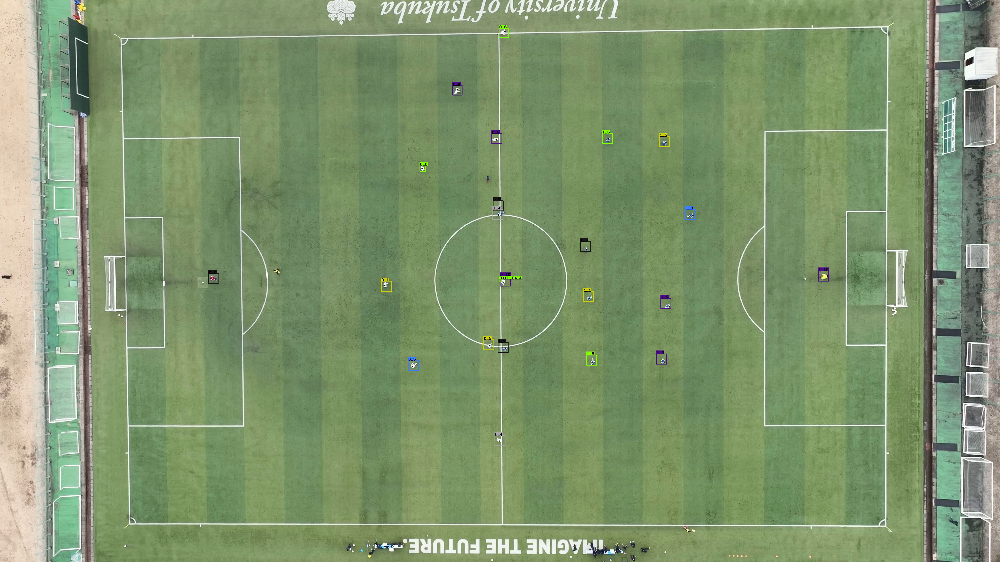

In [4]:
frame = cam.get_frame(1)
vis_frame = bbdf.visualize_frame(1, frame)

slk.utils.cv2pil(vis_frame, convert_bgr2rgb=False)

### 3. Convert BoundingBox to pitch coordinates

Load the json file which contains the pitch keypoints.

The result return a 3x3 homography matrix. It's a matrix that can transform a plane in 8 degrees of freedom.

More explaination : https://docs.opencv.org/4.x/d9/dab/tutorial_homography.html

In [5]:
from sportslabkit.utils import load_keypoints

cam.source_keypoints, cam.target_keypoints = load_keypoints('../archive/drone_keypoints.json')
print(cam.H)

[[  -0.035721   -0.000927      122.57]
 [ 0.00092839   -0.036521      72.114]
 [ 8.9951e-06 -7.8388e-06           1]]


In [6]:
codf = bbdf.to_codf(cam.H, method='center') # center because we want to get the center of the bounding box
codf.head()

TeamID              0                                                         \
PlayerID            0                     1                    10              
Attributes          x          y          x          y          x          y   
frame                                                                          
1           92.365250  33.814163  68.239372  33.179588  51.825901  34.183048   
2           92.337555  33.769264  68.239494  33.190693  51.924019  34.145424   
3           92.309860  33.724365  68.239609  33.201797  52.022141  34.107800   
4           92.282166  33.679470  68.239731  33.212902  52.120270  34.070168   
5           92.254471  33.634571  68.239853  33.224003  52.218407  34.032536   

TeamID                                                  ...          1  \
PlayerID            2                     3             ...          6   
Attributes          x          y          x          y  ...          x   
frame                                                   ...              
1           53.250252  53.739902  64.389832  22.220503  ...  38.155556   
2           53.178905  53.749687  64.335564  22.221592  ...  38.155804   
3           53.107563  53.759476  64.281288  22.222681  ...  38.156052   
4           53.036224  53.769264  64.227020  22.223770  ...  38.156300   
5           52.964886  53.779049  64.172752  22.224859  ...  38.156544   

TeamID                                                                        \
PlayerID                       7                     8                     9   
Attributes          y          x          y          x          y          x   
frame                                                                          
1           53.960960  51.981018  24.960875  39.768978  23.470837  29.759342   
2           53.975163  51.985706  24.974318  39.768993  23.471716  29.764608   
3           53.989365  51.990391  24.987759  39.769009  23.472595  29.769873   
4           54.003563  51.995079  25.001200  39.769024  23.473469  29.775139   
5           54.017765  51.999763  25.014641  39.769039  23.474348  29.780413   

TeamID                      BALL             
PlayerID                    BALL             
Attributes          y          x          y  
frame                                        
1           31.485733  52.490284  34.225567  
2           31.495867  52.682812  34.199799  
3           31.505997  52.875359  34.174030  
4           31.516130  53.067928  34.148258  
5           31.526258  53.260513  34.122482  

[5 rows x 46 columns]

Let's visualize the projection

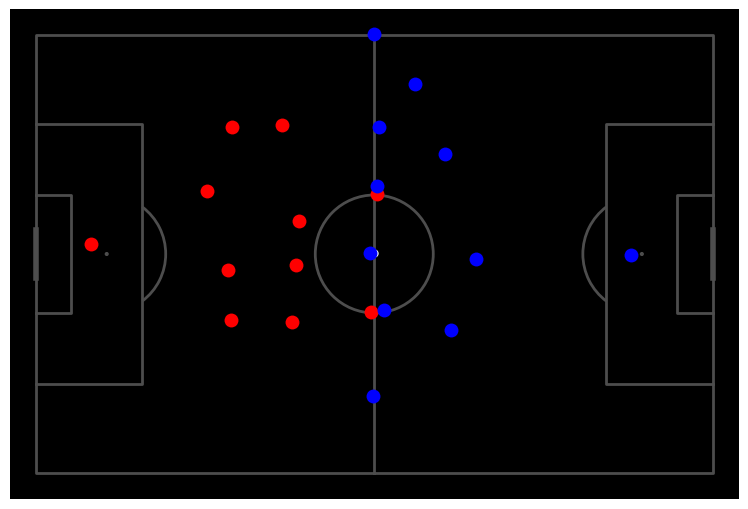

In [7]:
codf.visualize_frame(1, home_key='0', away_key='1', ball_key='BALL')

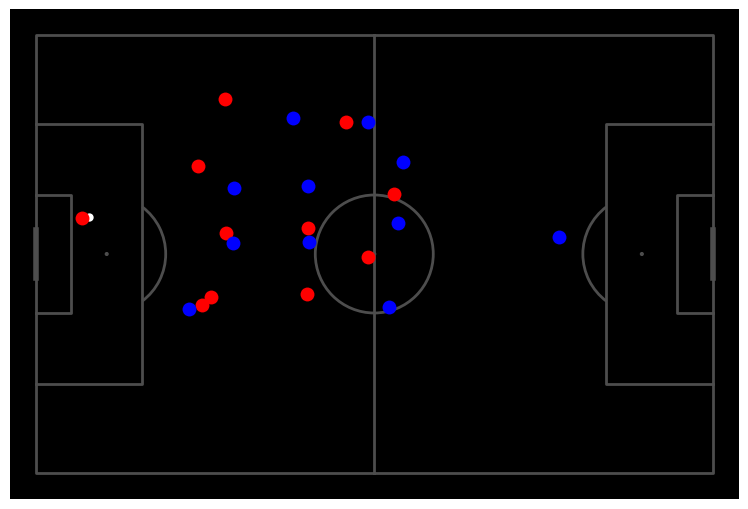

In [8]:
codf.visualize_frames("save.mp4",
    home_key='0', away_key='1', ball_key='BALL',
    save_kwargs={"fps": 30})

### Get 2D video for 30 min of the game

In [19]:
import pandas as pd
from sportslabkit import CoordinatesDataFrame


new_dataset_path = Path('../new_dataset')
new_paths_to_csv = sorted(new_dataset_path.glob("*.csv"))

global_pcdf = CoordinatesDataFrame()

print(new_paths_to_csv)

for new_path_to_csv in new_paths_to_csv:
    pcdf = slk.load_df(new_path_to_csv, df_type="coordinates")
    global_pcdf = pd.concat([global_pcdf, pcdf])
    
global_pcdf.reset_index(inplace=True)
global_pcdf.to_csv('global_pcdf.csv', index=True)

[PosixPath('../new_dataset/D_20220220_1_0000_0030.csv'), PosixPath('../new_dataset/D_20220220_1_0030_0060.csv'), PosixPath('../new_dataset/D_20220220_1_0060_0090.csv'), PosixPath('../new_dataset/D_20220220_1_0090_0120.csv'), PosixPath('../new_dataset/D_20220220_1_0120_0150.csv'), PosixPath('../new_dataset/D_20220220_1_0150_0180.csv'), PosixPath('../new_dataset/D_20220220_1_0180_0210.csv'), PosixPath('../new_dataset/D_20220220_1_0210_0240.csv'), PosixPath('../new_dataset/D_20220220_1_0240_0270.csv'), PosixPath('../new_dataset/D_20220220_1_0270_0300.csv'), PosixPath('../new_dataset/D_20220220_1_0300_0330.csv'), PosixPath('../new_dataset/D_20220220_1_0330_0360.csv'), PosixPath('../new_dataset/D_20220220_1_0360_0390.csv'), PosixPath('../new_dataset/D_20220220_1_0390_0420.csv'), PosixPath('../new_dataset/D_20220220_1_0420_0450.csv'), PosixPath('../new_dataset/D_20220220_1_0450_0480.csv'), PosixPath('../new_dataset/D_20220220_1_0480_0510.csv'), PosixPath('../new_dataset/D_20220220_1_0510_054

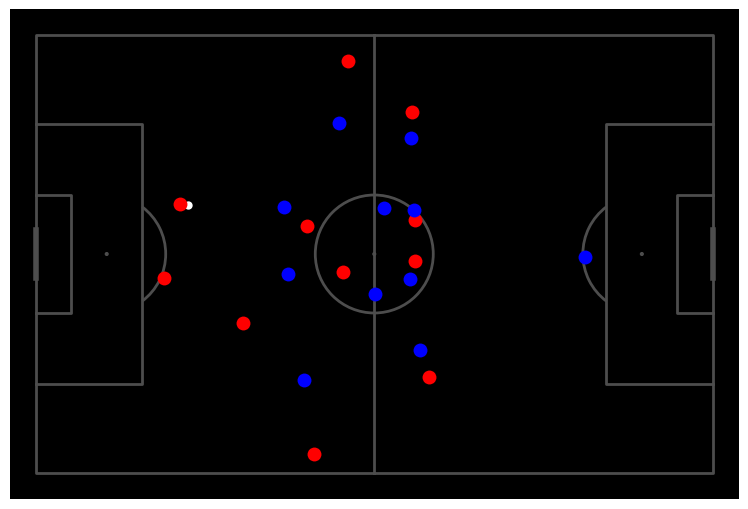

In [22]:
global_pcdf.visualize_frames(save_path="full_game_2D.mp4",
    home_key='0', away_key='1', ball_key='BALL',
    save_kwargs={"fps": 30})